# Semi-supervised learning for classification with clustering-assisted labelling.

## Background

Semi-supervised learning is a type of machine learning where only some of the data is labeled and the goal is to use the labeled data to make predictions on the unlabeled data. Clustering-assisted labeling is a technique used in semi-supervised learning where clustering is used to group similar data points together and then assign labels to these groups.

The basic idea behind clustering-assisted labeling is to use clustering to group similar data points together, and then use the labeled data to assign labels to the clusters. Once the clusters have been labeled, the labels can be propagated to the unlabeled data points in the same cluster.

The advantage of using clustering-assisted labeling is that it allows us to make use of the structure in the data to generate labels for the unlabeled data. This can be particularly useful in cases where labeling the data manually is time-consuming or expensive.

In the context of algo trading, clustering-assisted labeling can be used to create labels for financial data, such as stock prices or exchange rates. The clustering algorithm can be used to group similar data points together based on their attributes, such as volatility or volume. The labeled data can then be used to train a machine learning algorithm to make predictions on the unlabeled data.

To-Do:
- [ ] Investigate more on the 3 gates method
- [ ] Calculate Sortino and Sharpe Ratio 

---
## 0. Imports

In [1]:
# Imports
import pandas as pd
import numpy as np
from pathlib import Path

from sklearn.preprocessing import StandardScaler

import sys
sys.path.append('../../functions_library')

from functions import ROC, model_selection, Backtesting

#import sklearn 
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
import sklearn.ensemble

# Classification Metrics 
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, roc_auc_score, roc_curve, auc #plot_roc_curve, auc
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

# ML models 
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn import svm
import xgboost as xgb

# libraries for Shapely analysis
import shap 

# Visualization libraries
import matplotlib.pyplot as plt
import hvplot.pandas

seed = 42

---
## 1. Data Loading

Read the CSV file into Pandas DataFrame

In [2]:
# Import the OHLCV dataset into a Pandas Dataframe
trading_df = pd.read_csv(
    Path("../../Resources/ETHUSDT-1h-data.csv"), 
    index_col="timestamp", 
    infer_datetime_format=True, 
    parse_dates=True
)

trading_df = trading_df.drop(["close_time","quote_av","trades","tb_base_av","tb_quote_av","ignore"], axis =1)

# Review the DataFrame
trading_df.head()

,open,high,low,close,volume
timestamp,,,,,
2017-08-17 04:00:00,301.13,302.57,298.0,301.61,125.66877
2017-08-17 05:00:00,301.61,303.28,300.0,303.10,377.67246
2017-08-17 06:00:00,302.40,304.44,301.9,302.68,303.86672
2017-08-17 07:00:00,302.68,307.96,302.6,307.96,754.74510
2017-08-17 08:00:00,307.95,309.97,307.0,308.62,150.75029


Add a daily return values column to the DataFrame

In [3]:
# Calculate the daily returns using the closing prices and the pct_change function
trading_df["actual_returns"] = trading_df["close"].pct_change()

# Drop all NaN values from the DataFrame
trading_df = trading_df.dropna()

# Review the DataFrame
display(trading_df.head())
display(trading_df.tail())

,open,high,low,close,volume,actual_returns
timestamp,,,,,,
2017-08-17 05:00:00,301.61,303.28,300.00,303.10,377.67246,0.004940
2017-08-17 06:00:00,302.40,304.44,301.90,302.68,303.86672,-0.001386
2017-08-17 07:00:00,302.68,307.96,302.60,307.96,754.74510,0.017444
2017-08-17 08:00:00,307.95,309.97,307.00,308.62,150.75029,0.002143
2017-08-17 09:00:00,308.62,312.00,308.62,310.00,469.27879,0.004472


,open,high,low,close,volume,actual_returns
timestamp,,,,,,
2023-01-23 18:00:00,1629.03,1640.49,1626.06,1628.85,26815.5440,-0.000104
2023-01-23 19:00:00,1628.85,1630.57,1610.04,1619.88,27357.8436,-0.005507
2023-01-23 20:00:00,1619.89,1635.26,1618.65,1634.80,13128.4739,0.009211
2023-01-23 21:00:00,1634.80,1635.50,1629.53,1631.84,9298.6748,-0.001811
2023-01-23 22:00:00,1631.84,1635.75,1630.90,1632.64,5790.1341,0.000490


In [4]:
# Import the OHLCV dataset into a Pandas Dataframe
fng_df = pd.read_csv(
    Path("../../Resources/altme_fng.csv"), 
    index_col="date", 
    infer_datetime_format=True, 
    parse_dates=True,
    dayfirst=True,
    skiprows = [0,1]
)

#resample to 1H timeframe
fng_df = fng_df.resample('1H').ffill()

# fill the fng_classification column with the same value for each day of 24H
fng_df['fng_classification'] = fng_df['fng_classification'].fillna(method='ffill')

# Review the DataFrame
fng_df.head()

,fng_value,fng_classification
date,,
2018-02-01 00:00:00,30,Fear
2018-02-01 01:00:00,30,Fear
2018-02-01 02:00:00,30,Fear
2018-02-01 03:00:00,30,Fear
2018-02-01 04:00:00,30,Fear


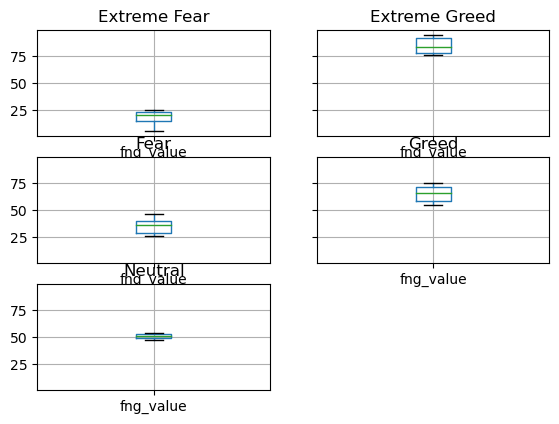

In [5]:
# Group by fng_classification and display boxplots for other columns
fng_df.groupby("fng_classification").boxplot(column=["fng_value"])

# Show the plot
plt.show()

In [6]:
merged_df = pd.merge(fng_df, trading_df, how='inner', left_index=True, right_index=True)

In [7]:
merged_df

,fng_value,fng_classification,open,high,low,close,volume,actual_returns
2018-02-01 00:00:00,30,Fear,1125.96,1137.99,1120.56,1132.00,3465.84651,0.006392
2018-02-01 01:00:00,30,Fear,1132.00,1140.89,1125.01,1135.00,4149.14991,0.002650
2018-02-01 02:00:00,30,Fear,1134.07,1154.99,1134.07,1150.50,4828.74525,0.013656
2018-02-01 03:00:00,30,Fear,1150.51,1164.99,1125.01,1140.00,7622.31840,-0.009126
2018-02-01 04:00:00,30,Fear,1140.00,1154.72,1130.18,1152.51,3899.48396,0.010974
...,...,...,...,...,...,...,...,...
2023-01-23 18:00:00,50,Neutral,1629.03,1640.49,1626.06,1628.85,26815.54400,-0.000104
2023-01-23 19:00:00,50,Neutral,1628.85,1630.57,1610.04,1619.88,27357.84360,-0.005507
2023-01-23 20:00:00,50,Neutral,1619.89,1635.26,1618.65,1634.80,13128.47390,0.009211
2023-01-23 21:00:00,50,Neutral,1634.80,1635.50,1629.53,1631.84,9298.67480,-0.001811


---
## 2. Feature Engineering

In [8]:
import finta as ft
from finta import TA
import talib

ohlcv_df = merged_df

# List of time periods to use for Moving Averages calculation
timeperiods = [5,7,14,20,30,50,70,100,150,200]

df_eng = ohlcv_df.copy()

# Calculate SMAs and add them to the DataFrame
for t in timeperiods:
    #tsma = TA.SMA(df_eng t).shift(1)
    sma = TA.SMA(df_eng,t)
    ema = TA.EMA(df_eng,t)
    atr = TA.ATR(df_eng,t)  #Average True Range
    adx = TA.ADX(df_eng,t) 
    rsi = TA.RSI(df_eng,t)
    hma = TA.HMA(df_eng,t)
    vama = TA.VAMA(df_eng,t)
 
    # calculate the Force Index
    force_index = pd.Series(df_eng['close'].diff(1) * df_eng['volume'], index=df_eng.index)
    force_ema = force_index.ewm(span=t, min_periods=0, adjust=True, ignore_na=False).mean()    
    
    #df['force_index'] = force_index
    #df[f'force_index_ema_{t}'] = force_ema # add the Force Index and its EMA to the DataFrame
    #df[f'TSMA_{t}'] = tsma
    df_eng[f'SMA_{t}'] = sma
    df_eng[f'EMA_{t}'] = ema
    df_eng[f'HMA_{t}'] = hma
    df_eng[f'VAMA_{t}'] = vama
    df_eng[f'ATR_{t}'] = atr
    df_eng[f'ADX_{t}'] = adx
    df_eng[f'RSI_{t}'] = rsi
    
    
# Calculate the Parabolic SAR
#sar = TA.PSAR(df)

# Add the SAR values and trend direction to the DataFrame
#df['sar'] = sar['psar']
#df['psarbear'] = sar['psarbear']
#df['psarbull'] = sar['psarbull']

df_eng['UO'] = TA.UO(df_eng)

# Adding Awesome Indicator (AO)
df_eng['AO'] = TA.AO(df_eng)
df_eng['OBV'] =TA.OBV(df_eng)

# Adding Chaikin Indicator 
df_eng['CHAIKIN'] = TA.CHAIKIN(df_eng)

# Adding Bollinger Bands
df_eng[['BB_UPPER','BB_MED','BB_LOWER']] =TA.BBANDS(df_eng)

# Calculate the Keltner Channel with TALIB
#df[['KC_UPPER','KC_MED','KC_LOWER']] = TA.KC(df)

# calculate Commodity Channel Index (CCI)
df_eng['cci'] = TA.CCI(df_eng)

# assuming you have OHLCV data in a pandas dataframe called "df"
#volume_momentum = talib.MOM(df['volume'])

In [9]:
# calculate the Ichimoku Kinko Hyo indicator
# Calculate the conversion line
nine_period_high = df_eng['high'].rolling(window=9).max()
nine_period_low = df_eng['low'].rolling(window=9).min()
df_eng['tenkan_sen'] = (nine_period_high + nine_period_low) / 2

# Calculate the base line
periods = 26
twenty_six_period_high = df_eng['high'].rolling(window=periods).max()
twenty_six_period_low = df_eng['low'].rolling(window=periods).min()
df_eng['kijun_sen'] = (twenty_six_period_high + twenty_six_period_low) / 2

# Calculate the leading span A
df_eng['senkou_span_a'] = ((df_eng['tenkan_sen'] + df_eng['kijun_sen']) / 2).shift(periods=periods)

# Calculate the leading span B
periods2 = 52
fifty_two_period_high = df_eng['high'].rolling(window=periods2).max()
fifty_two_period_low = df_eng['low'].rolling(window=periods2).min()
df_eng['senkou_span_b'] = ((fifty_two_period_high + fifty_two_period_low) / 2).shift(periods=periods)

# Calculate the lagging span
df_eng['chikou_span'] = df_eng['close'].shift(periods=-periods)


#### Add a daily return values column to the DataFrame

In [10]:
# Calculate the daily returns using the closing prices and the pct_change function
df_eng["actual_returns"] = df_eng["close"].pct_change()

# Drop all NaN values from the DataFrame
df_eng = df_eng.dropna()

# Review the DataFrame
df_eng.head()

,fng_value,fng_classification,open,high,low,close,volume,actual_returns,SMA_5,EMA_5,...,CHAIKIN,BB_UPPER,BB_MED,BB_LOWER,cci,tenkan_sen,kijun_sen,senkou_span_a,senkou_span_b,chikou_span
2018-02-18 23:00:00,63,Greed,917.09,918.55,907.75,911.00,6721.04031,-0.007074,927.274,922.858166,...,1592.367588,954.592387,929.0245,903.456613,-133.569399,928.27,937.75,957.780,937.68,951.59
2018-02-19 00:00:00,67,Greed,911.00,922.94,906.04,921.76,5083.44557,0.011811,922.698,922.492111,...,2174.456147,950.742237,927.4950,904.247763,-91.552291,925.74,937.75,958.435,937.68,942.70
2018-02-19 01:00:00,67,Greed,922.39,933.50,917.75,929.00,3830.15285,0.007855,921.598,924.661407,...,2737.199024,950.525470,928.2925,906.059530,-4.313610,925.74,937.75,959.120,937.68,945.06
2018-02-19 02:00:00,67,Greed,928.19,929.06,912.21,925.90,3512.92499,-0.003337,921.030,925.074271,...,3417.085862,950.562403,928.4140,906.265597,-42.381210,925.74,937.75,959.120,937.68,946.53
2018-02-19 03:00:00,67,Greed,925.89,928.00,917.10,921.43,2661.29722,-0.004828,921.818,923.859514,...,3210.560786,949.838141,927.7240,905.609859,-40.287643,925.74,937.75,961.370,939.68,947.93


---
## 3. Pre-Processing
### 3.1 Remove highly-correlated features

In [11]:
df_feats = df_eng.copy()
df_feats = df_feats.drop(["open","high","low","fng_value"], axis =1)

In [12]:

# Calculate correlation matrix
# calculate the correlation matrix of the features
corr_matrix = df_feats.corr()

# set the threshold for correlation value
corr_threshold = 0.45

# find the highly correlated features and drop them from the dataframe
high_corr_features = np.where(corr_matrix.abs() > corr_threshold)
high_corr_features = [(corr_matrix.columns[x], corr_matrix.columns[y]) for x, y in zip(*high_corr_features) if x != y and x < y]
df_feats.drop([col[1] for col in high_corr_features], axis=1, inplace=True)

# select the remaining features with low correlation
low_corr_features = df_feats.columns.tolist()

# print the low correlated features
print(low_corr_features)

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.


['fng_classification', 'close', 'volume', 'actual_returns', 'ADX_5']


In [13]:
df_feats = df_feats[['fng_classification', 'volume', 'ADX_5']]

In [14]:
# replace spaces with underscores in the categorical column
df_feats["fng_classification"] = df_feats["fng_classification"].str.replace("Extreme ", "Hi_")

In [15]:
df_feats["fng_classification"].value_counts()

Fear        15102
Hi_Fear     12598
Greed        7145
Hi_Greed     4419
Neutral      3720
Name: fng_classification, dtype: int64

In [16]:
# Get dummy variables for the categorical column
dummy_df = pd.get_dummies(df_feats['fng_classification'], prefix='fng')

# Concatenate the original DataFrame with the dummy-encoded DataFrame
df_encoded = pd.concat([df_feats, dummy_df], axis=1)

# Drop the original categorical column (optional)
df_encoded.drop('fng_classification', axis=1, inplace=True)

df_encoded

,volume,ADX_5,fng_Fear,fng_Greed,fng_Hi_Fear,fng_Hi_Greed,fng_Neutral
2018-02-18 23:00:00,6721.04031,35.752063,0,1,0,0,0
2018-02-19 00:00:00,5083.44557,35.746290,0,1,0,0,0
2018-02-19 01:00:00,3830.15285,30.276940,0,1,0,0,0
2018-02-19 02:00:00,3512.92499,26.330905,0,1,0,0,0
2018-02-19 03:00:00,2661.29722,23.174078,0,1,0,0,0
...,...,...,...,...,...,...,...
2023-01-22 16:00:00,13393.69640,26.769332,0,0,0,0,1
2023-01-22 17:00:00,32756.02920,29.326878,0,0,0,0,1
2023-01-22 18:00:00,16107.61990,31.372915,0,0,0,0,1
2023-01-22 19:00:00,16117.31210,25.354774,0,0,0,0,1


---
### 4 Clustering

> values that works well: dbscan = DBSCAN(eps=3, min_samples=600)

In [17]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

# Scale the data
scaler = StandardScaler()
X = scaler.fit_transform(df_encoded)

# Create and fit the DBSCAN model
dbscan = DBSCAN(eps=1, min_samples=50)
clusters = dbscan.fit_predict(X)

# Add the cluster labels to the original dataframe
df_encoded['cluster'] = clusters

In [18]:
unique_clusters = df_encoded['cluster'].unique()
print(unique_clusters)

[ 0  1  2  3 -1  4]


In [19]:
df_encoded[['close','actual_returns']] = df_eng[['close','actual_returns']]

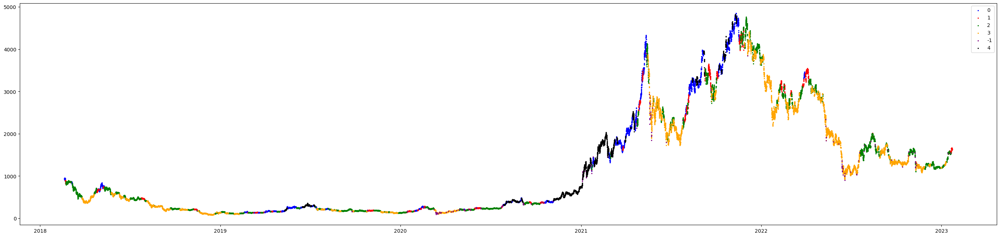

In [20]:
# Plot the time series with clusters in different colors
fig, ax = plt.subplots(figsize=(35, 8))
for label, color in zip(df_encoded['cluster'].unique(), ['blue', 'red', 'green', 'orange', 'purple','black','grey','yellow','magenta','cyan']):
    mask = df_encoded['cluster'] == label
    ax.scatter(df_encoded.index[mask], df_encoded['close'][mask], label=label, c=color, s=2)
ax.legend()
plt.show()

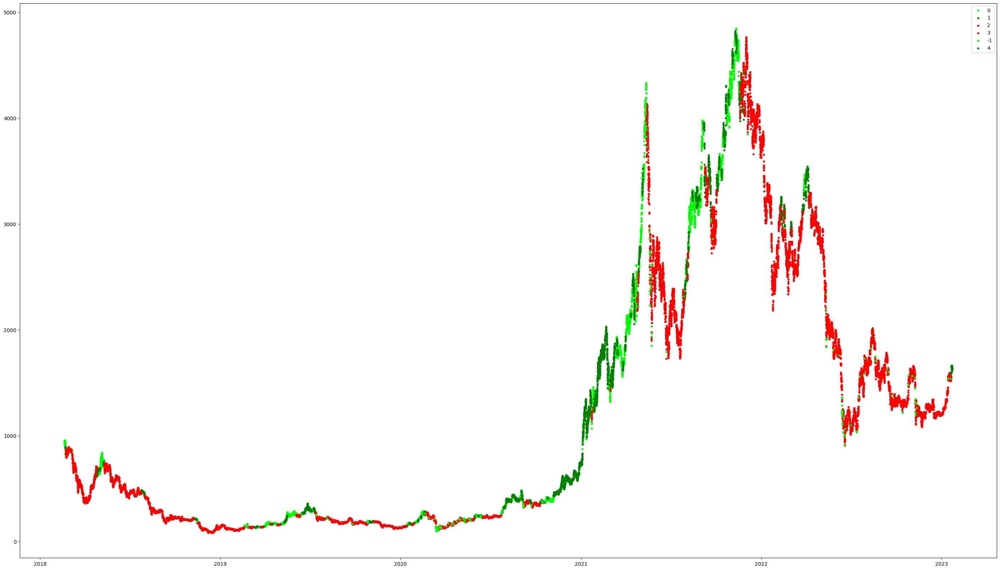

In [21]:
# Plot the time series with clusters in different colors
fig, ax = plt.subplots(figsize=(35, 20))
for label, color in zip(df_encoded['cluster'].unique(), ['lime', 'green', 'red', 'red', 'lime','green']):
    mask = df_encoded['cluster'] == label
    ax.scatter(df_encoded.index[mask], df_encoded['close'][mask], label=label, c=color, s=10)
ax.legend()
plt.show()

In [22]:
# Display the plot inline in Jupyter Lab
%matplotlib inline

# Create the scatter plot using hvplot.scatter
scatter = df_encoded.hvplot.scatter(x='index', y='close', by='cluster', legend='top')

# Set the plot options
scatter.opts(
    title='Time Series with Clusters',
    xlabel='Date',
    ylabel='Close Price',
    height=500,
    width=1000
)

# Show the plot
hvplot.show(scatter)

Launching server at http://localhost:53652


In [23]:
df_eda  = df_encoded


In [24]:
df_eda [['fng_value','fng_classification','actual_returns']] = df_eng [['fng_value','fng_classification','actual_returns']]

In [25]:
df_eda.columns

Index(['volume', 'ADX_5', 'fng_Fear', 'fng_Greed', 'fng_Hi_Fear',
       'fng_Hi_Greed', 'fng_Neutral', 'cluster', 'close', 'actual_returns',
       'fng_value', 'fng_classification'],
      dtype='object')

<Axes: xlabel='cluster', ylabel='fng_value'>

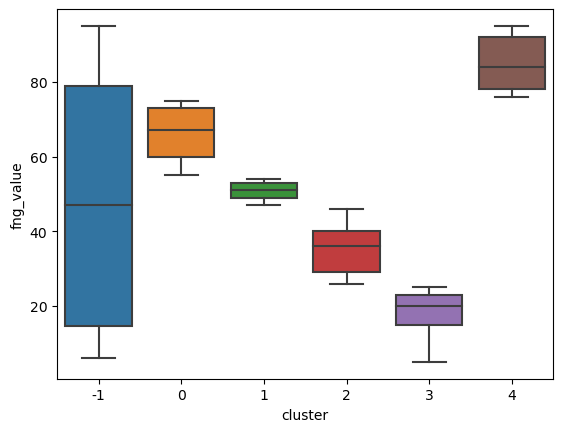

In [26]:
import seaborn as sns

# create a new DataFrame with just the relevant columns
cluster_df = df_eda[['cluster', 'fng_value', 'actual_returns']]

# create boxplots of fng_value and actual_returns for each cluster
sns.boxplot(data=cluster_df, x='cluster', y='fng_value')


<Axes: xlabel='cluster', ylabel='actual_returns'>

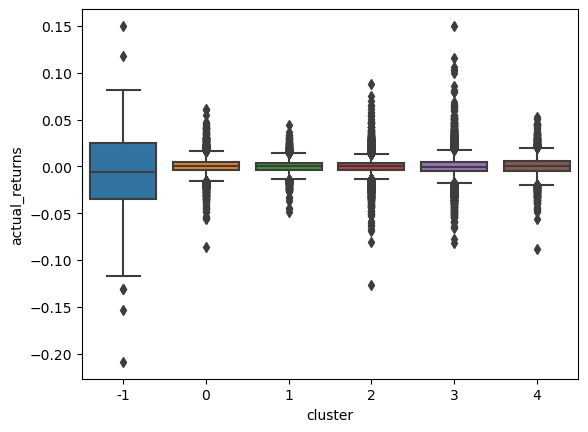

In [27]:
sns.boxplot(data=cluster_df, x='cluster', y='actual_returns')

In [28]:
# Replace cluster labels -1 and 3 with 1, and the rest with 0
df_eda['signal'] = np.where((df_eda['cluster']==-1) | (df_eda['cluster']==2)| (df_eda['cluster']==3 | (df_eda['cluster']==4)), 0, 1)


In [29]:
# Replace cluster labels -1 and 3 with 1, and the rest with 0
df_eda['signal'] = np.where(((df_eda['cluster']==3)| (df_eda['cluster']==2 )| (df_eda['cluster']==1)), 0, 1)

> keeping previous code : # Replace cluster labels -1 and 3 with 1, and the rest with 0
> df_eda['signal'] = np.where((df_eda['cluster']==-1) | (df_eda['cluster']==2)| (df_eda['cluster']==3 | (df_eda['cluster']==0)), 0, 1)

In [30]:
df_eda['signal'].unique()

array([1, 0])

In [31]:
df_eda['signal'].value_counts()

0    31258
1    11726
Name: signal, dtype: int64

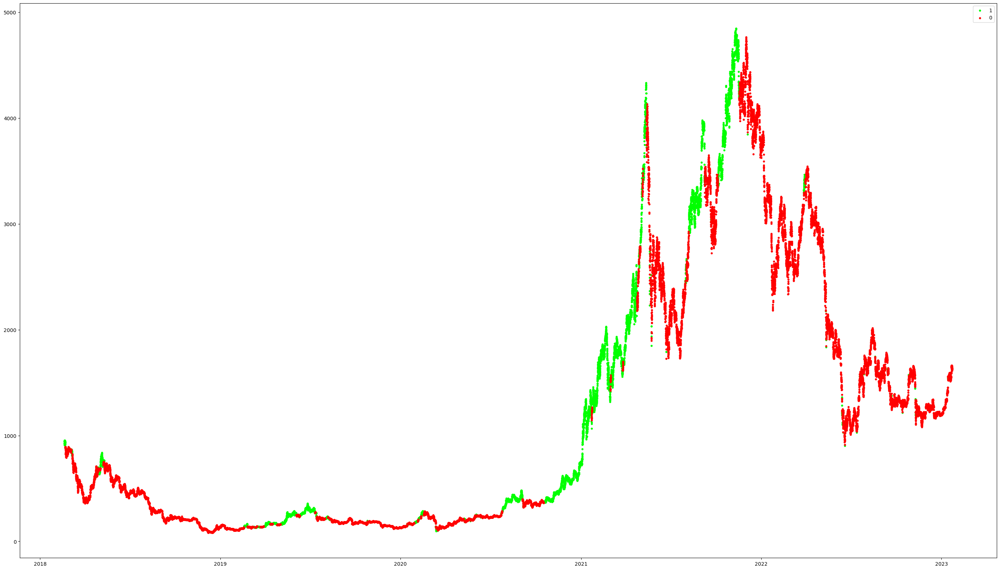

In [32]:
# Plot the time series with clusters in different colors
fig, ax = plt.subplots(figsize=(35, 20))
for label, color in zip(df_eda['signal'].unique(), ['lime','red']):
    mask = df_eda['signal'] == label
    ax.scatter(df_eda.index[mask], df_eda['close'][mask], label=label, c=color, s=10)
ax.legend()
plt.show()

In [33]:
# Display the plot inline in Jupyter Lab
%matplotlib inline

# Plot the time series with clusters in different colors
plot = df_encoded.hvplot.scatter(x='index', y='close',  c='cluster', legend='top_left', height=500, width=1000, title='Clusters of Time Series')

# Show the plot in Jupyter notebook
plot

:Scatter   [index]   (close,cluster)

In [34]:
# Set initial capital
initial_capital = float(100000)

# Set the share size
share_size = 500

# Buy a 500 share position when the dual moving average crossover Signal equals 1
# Otherwise, `Position` should be zero (sell)
df_eda['Position'] = share_size * df_eda['signal']

# Determine the points in time where a 500 share position is bought or sold
df_eda['Entry/Exit Position'] = df_eda['Position'].diff()

# Multiply the close price by the number of shares held, or the Position
df_eda['Portfolio Holdings'] = df_eda['close'] * df_eda['Position']

# Subtract the amount of either the cost or proceeds of the trade from the initial capital invested
df_eda['Portfolio Cash'] = initial_capital - (df_eda['close'] * df_eda['Entry/Exit Position']).cumsum() 

# Calculate the total portfolio value by adding the portfolio cash to the portfolio holdings (or investments)
df_eda['Portfolio Total'] = df_eda['Portfolio Cash'] + df_eda['Portfolio Holdings']

# Calculate the portfolio daily returns
df_eda['Portfolio Daily Returns'] = df_eda['Portfolio Total'].pct_change()

# Calculate the portfolio cumulative returns
df_eda['Portfolio Cumulative Returns'] = (1 + df_eda['Portfolio Daily Returns']).cumprod() - 1



In [35]:
# Visualize the value of the total portfolio
total_portfolio_value = df_eda[['Portfolio Total']].hvplot(
    line_color='lightgray',
    ylabel='Total Portfolio Value',
    xlabel='Date',
    width=1000,
    height=400
)


In [36]:
total_portfolio_value

:Curve   [index]   (Portfolio Total)

In [37]:
df_eda.head()

,volume,ADX_5,fng_Fear,fng_Greed,fng_Hi_Fear,fng_Hi_Greed,fng_Neutral,cluster,close,actual_returns,fng_value,fng_classification,signal,Position,Entry/Exit Position,Portfolio Holdings,Portfolio Cash,Portfolio Total,Portfolio Daily Returns,Portfolio Cumulative Returns
2018-02-18 23:00:00,6721.04031,35.752063,0,1,0,0,0,0,911.00,-0.007074,63,Greed,1,500,NaN,455500.0,NaN,NaN,NaN,NaN
2018-02-19 00:00:00,5083.44557,35.746290,0,1,0,0,0,0,921.76,0.011811,67,Greed,1,500,0.0,460880.0,100000.0,560880.0,NaN,NaN
2018-02-19 01:00:00,3830.15285,30.276940,0,1,0,0,0,0,929.00,0.007855,67,Greed,1,500,0.0,464500.0,100000.0,564500.0,0.006454,0.006454
2018-02-19 02:00:00,3512.92499,26.330905,0,1,0,0,0,0,925.90,-0.003337,67,Greed,1,500,0.0,462950.0,100000.0,562950.0,-0.002746,0.003691
2018-02-19 03:00:00,2661.29722,23.174078,0,1,0,0,0,0,921.43,-0.004828,67,Greed,1,500,0.0,460715.0,100000.0,560715.0,-0.003970,-0.000294


---
## 2ND Feat Engineering

In [38]:
import finta as ft
from finta import TA
import talib

prep_df = df_eng.copy()
prep_df['signal'] = df_eda['signal']


In [39]:
prep_df.columns

Index(['fng_value', 'fng_classification', 'open', 'high', 'low', 'close',
       'volume', 'actual_returns', 'SMA_5', 'EMA_5', 'HMA_5', 'VAMA_5',
       'ATR_5', 'ADX_5', 'RSI_5', 'SMA_7', 'EMA_7', 'HMA_7', 'VAMA_7', 'ATR_7',
       'ADX_7', 'RSI_7', 'SMA_14', 'EMA_14', 'HMA_14', 'VAMA_14', 'ATR_14',
       'ADX_14', 'RSI_14', 'SMA_20', 'EMA_20', 'HMA_20', 'VAMA_20', 'ATR_20',
       'ADX_20', 'RSI_20', 'SMA_30', 'EMA_30', 'HMA_30', 'VAMA_30', 'ATR_30',
       'ADX_30', 'RSI_30', 'SMA_50', 'EMA_50', 'HMA_50', 'VAMA_50', 'ATR_50',
       'ADX_50', 'RSI_50', 'SMA_70', 'EMA_70', 'HMA_70', 'VAMA_70', 'ATR_70',
       'ADX_70', 'RSI_70', 'SMA_100', 'EMA_100', 'HMA_100', 'VAMA_100',
       'ATR_100', 'ADX_100', 'RSI_100', 'SMA_150', 'EMA_150', 'HMA_150',
       'VAMA_150', 'ATR_150', 'ADX_150', 'RSI_150', 'SMA_200', 'EMA_200',
       'HMA_200', 'VAMA_200', 'ATR_200', 'ADX_200', 'RSI_200', 'UO', 'AO',
       'OBV', 'CHAIKIN', 'BB_UPPER', 'BB_MED', 'BB_LOWER', 'cci', 'tenkan_sen',
       'kiju

In [40]:
# Dummy-encoding process 
# create a list of categorical columns
cat_cols = ['fng_classification']

# use the get_dummies function to dummy encode the categorical columns
dummy_cols = pd.get_dummies(prep_df[cat_cols], prefix=cat_cols, drop_first=True)

# concatenate the dummy columns with the original dataframe
prep_df = pd.concat([prep_df.drop(cat_cols, axis=1), dummy_cols], axis=1)

In [41]:
prep_df['signal'].value_counts()

0    31258
1    11726
Name: signal, dtype: int64

___
### 3.5 Class Imbalance

In [42]:
import pandas as pd
from sklearn.utils import resample

# Count the number of samples in each class
class_counts = prep_df['signal'].value_counts()

# Find the class with fewer samples
minority_class = class_counts.idxmin()

# Split the dataframe into the majority and minority classes
majority_class = prep_df[prep_df['signal'] != minority_class]
minority_class = prep_df[prep_df['signal'] == minority_class]

# Undersample the majority class to match the number of samples in the minority class
undersampled_majority = resample(majority_class,
                                 replace=False,
                                 n_samples=len(minority_class),
                                 random_state=42)

# Combine the undersampled majority class with the minority class
balanced_df = pd.concat([undersampled_majority, minority_class])

# Shuffle the rows in the balanced dataframe
balanced_df = balanced_df.sample(frac=1, random_state=42)

In [43]:
balanced_df["signal"].value_counts()

0    11726
1    11726
Name: signal, dtype: int64

In [44]:
# Creating X as predictors (features) dataset
X= balanced_df.copy()

# sort X by index
X = X.sort_index(axis=0)

# Removing columns indicative of previous prices
# & shifting X one row down to avoid using data not available to us at the time of prediction
X= X.drop(["open","high","low","close","volume","actual_returns","signal"], axis =1).shift().dropna().copy()

In [45]:
X

,fng_value,SMA_5,EMA_5,HMA_5,VAMA_5,ATR_5,ADX_5,RSI_5,SMA_7,EMA_7,...,cci,tenkan_sen,kijun_sen,senkou_span_a,senkou_span_b,chikou_span,fng_classification_Extreme Greed,fng_classification_Fear,fng_classification_Greed,fng_classification_Neutral
2018-02-19 00:00:00,63.0,927.274,922.858166,907.645333,924.694386,13.798,35.752063,23.500363,930.428571,925.527553,...,-133.569399,928.270,937.75,957.7800,937.68,951.59,0.0,0.0,1.0,0.0
2018-02-19 01:00:00,67.0,922.698,922.492111,912.577333,921.344398,14.604,35.746290,43.379263,928.037143,924.585665,...,-91.552291,925.740,937.75,958.4350,937.68,942.70,0.0,0.0,1.0,0.0
2018-02-19 02:00:00,67.0,921.598,924.661407,926.347333,920.455745,14.960,30.276940,53.534689,926.732857,925.689249,...,-4.313610,925.740,937.75,959.1200,937.68,945.06,0.0,0.0,1.0,0.0
2018-02-19 03:00:00,67.0,921.030,925.074271,930.762222,919.645504,15.058,26.330905,48.845672,924.055714,925.741936,...,-42.381210,925.740,937.75,959.1200,937.68,946.53,0.0,0.0,1.0,0.0
2018-02-19 04:00:00,67.0,921.818,923.859514,925.075333,920.219095,14.240,23.174078,42.185762,922.188571,924.663952,...,-40.287643,925.740,937.75,961.3700,939.68,947.93,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-22 06:00:00,53.0,1623.196,1626.585966,1628.913111,1623.244148,12.116,44.971745,44.642798,1624.998571,1628.423111,...,-75.757963,1634.285,1641.63,1621.0600,1592.88,1633.30,0.0,0.0,0.0,1.0
2023-01-22 07:00:00,53.0,1624.176,1627.320644,1630.406667,1624.020252,9.362,38.537177,46.857887,1625.302857,1628.514833,...,-64.990188,1633.835,1641.63,1623.9300,1594.97,1631.41,0.0,0.0,0.0,1.0
2023-01-22 09:00:00,53.0,1626.456,1627.240429,1628.906444,1626.642713,5.674,33.389522,43.359249,1624.550000,1628.156125,...,-62.328952,1623.950,1641.63,1632.6550,1594.97,1634.75,0.0,0.0,0.0,1.0
2023-01-22 18:00:00,53.0,1627.974,1627.380191,1627.898222,1628.038968,6.612,42.200489,39.877494,1626.935714,1627.945945,...,-58.134659,1618.565,1641.63,1634.4600,1594.97,1636.67,0.0,0.0,0.0,1.0


In [46]:
# Copy the new signal column to a new Series called y.
y = balanced_df["signal"].copy()

# keeping y and X the same size 
y = y[X.index]

In [47]:
y

2018-02-19 00:00:00    1
2018-02-19 01:00:00    1
2018-02-19 02:00:00    1
2018-02-19 03:00:00    1
2018-02-19 04:00:00    1
                      ..
2023-01-22 06:00:00    0
2023-01-22 07:00:00    0
2023-01-22 09:00:00    0
2023-01-22 18:00:00    0
2023-01-22 20:00:00    0
Name: signal, Length: 23451, dtype: int64

---
## ML Scaler

In [48]:
from sklearn.preprocessing import StandardScaler

# Scale the data
MLscaler = StandardScaler()
X_scaled = MLscaler.fit_transform(X)

# Convert the scaled numpy array back to a pandas DataFrame
X_scaled = pd.DataFrame(X_scaled, index=X.index, columns=X.columns)

In [ ]:
from sklearn.preprocessing import StandardScaler

# Create a StandardScaler object
scaler = StandardScaler()

# Scale the data
X_scaled = scaler.fit_transform(X)

# Convert X_scaled back to a DataFrame
X_scaled = pd.DataFrame(X_scaled, columns=X.columns)

# Create a logistic regression model
model = LogisticRegression(max_iter=200)

# Create an RFE model to select the best features
rfe = RFE(model, n_features_to_select=25)

# Fit the RFE model to the data
rfe = rfe.fit(X_scaled, y)

# Get the selected features
selected_features = X_scaled.columns[rfe.support_]

# Keep only specified columns in the dataframe
X_scaled = X_scaled[selected_features]

# Print the selected features
print("Number of selected features:", len(X_scaled.columns), "\nSelected features:\n", selected_features)


In [ ]:
df_lo_feats = X[selected_features].copy()
#df_lo_feats = df_lo_feats.drop(["fng_value"], axis =1)
# Calculate correlation matrix
# calculate the correlation matrix of the features
corr_matrix = df_lo_feats.corr()

# set the threshold for correlation value
corr_threshold = 0.90

# find the highly correlated features and drop them from the dataframe
high_corr_features = np.where(corr_matrix.abs() > corr_threshold)
high_corr_features = [(corr_matrix.columns[x], corr_matrix.columns[y]) for x, y in zip(*high_corr_features) if x != y and x < y]
df_lo_feats.drop([col[1] for col in high_corr_features], axis=1, inplace=True)

# select the remaining features with low correlation
low_corr_features = df_lo_feats.columns.tolist()

# print the low correlated features
print(low_corr_features)

In [ ]:
X=df_lo_feats[low_corr_features]
#X = X[selected_features]

In [ ]:
# Imports 
from pandas.tseries.offsets import DateOffset

# Select the start of the training period
training_begin = X.index.min()

# Display the training begin date
#print(training_begin)

# Select the ending period for the training data with an offset of 36 months
training_end = X.index.min() + DateOffset(months=36)

# Display the training end date
#print(training_end)

# Generate the X_train and y_train DataFrames
X_train = X.loc[training_begin:training_end]
y_train = y.loc[training_begin:training_end]

# Display sample data
display(X_train.head())

# Generate the X_test and y_test DataFrames
X_test = X.loc[training_end:]
y_test = y.loc[training_end:]

# Display sample data
display(X_test.head())

In [ ]:
## Scaler for ML pre-processing

In [ ]:
# Create a StandardScaler instance
scaler = StandardScaler()
 
# Apply the scaler model to fit the X-train data
X_scaler = scaler.fit(X_train)
 
# Transform the X_train and X_test DataFrames using the X_scaler
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

---
## 4. ML models 
#### 4.1 XGboost

In [ ]:
import xgboost as xgb
#from xgboost import xgbClassifier
from sklearn.metrics import accuracy_score, f1_score
from sklearn.model_selection import GridSearchCV

#replace -1 by 0 as xgboost expects a boolean target vector (only 0 and 1)
y_train = y_train.replace(-1, 0)
y_test = y_test.replace(-1, 0)

# Create a xgb Classifier model
xgb_clf = xgb.XGBClassifier(reg_alpha=0.1)

xgb_clf.fit(X_train_scaled, y_train) 

# Use the best model to make predictions on the test data
y_pred_xgb = xgb_clf.predict(X_test_scaled)

ROC(xgb_clf,X_train,X_test,y_train,y_test)

In [ ]:
# Define the trading fee as a decimal
trading_fee = 0.00075
classifier = xgb_clf

# Backtest using our exteranl function
xgb_predictions_df = Backtesting (prep_df, X_test, X_test_scaled, classifier,trading_fee)

# Calculate and plot the cumulative returns for the `actual_returns` and the `trading_algorithm_returns`
(1 + xgb_predictions_df[["actual_returns", "trading_algorithm_returns"]]).cumprod().plot()

> The XGB results appear to be too good to be true - the classification report are very weird as well --> not to use for production

In [ ]:
X_test.columns


---
#### 4.2 CatBoost

In [ ]:
# Import libraries
from catboost import CatBoostClassifier
# Initialize the CatBoost model

cb_clf = CatBoostClassifier(iterations=1000,random_state=seed,l2_leaf_reg=99000000000, verbose = False)

# Train the model on the training data
cb_clf.fit(X_train_scaled, y_train)

# display ROC and classification metrics 
ROC(cb_clf,X_train_scaled, X_test_scaled, y_train, y_test)


In [ ]:
# Define the trading fee as a decimal
trading_fee = 0.00075
classifier = cb_clf

# Backtest using our exteranl function
cb_predictions_df = Backtesting (df_eda, X_test, X_test_scaled, classifier,trading_fee)

# Calculate and plot the cumulative returns for the `actual_returns` and the `trading_algorithm_returns`
(1 + cb_predictions_df[["actual_returns", "trading_algorithm_returns"]]).cumprod().plot()

---
#### 4.3 LDA

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

# create LDA object and fit the model
lda = LinearDiscriminantAnalysis()

# Train the model on the training data
lda.fit_transform(X_train_scaled, y_train)

ROC(lda,X_train_scaled, X_test_scaled, y_train, y_test)

In [ ]:
# Define the trading fee as a decimal
trading_fee = 0.00075
classifier = lda

# Backtest using our exteranl function
lda_predictions_df = Backtesting (prep_df, X_test, X_test_scaled, classifier,trading_fee)

# Calculate and plot the cumulative returns for the `actual_returns` and the `trading_algorithm_returns`
(1 + lda_predictions_df[["actual_returns", "trading_algorithm_returns"]]).cumprod().plot()

## 4.4 Gradient Boosting Tree Classifier

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

# Initialize the model with regularization
gbt_clf = GradientBoostingClassifier(learning_rate = 0.99, subsample = 0.005, 
                                     max_depth=5, min_samples_split=4, 
                                     min_samples_leaf=2, max_leaf_nodes=None, random_state=seed)

# Train the model on the training data
gbt_clf.fit(X_train_scaled, y_train)

ROC(gbt_clf,X_train_scaled, X_test_scaled, y_train, y_test)


In [ ]:
# Define the trading fee as a decimal
trading_fee = 0.00075
classifier = gbt_clf

# Backtest using our exteranl function
gbt_predictions_df = Backtesting (prep_df, X_test, X_test_scaled, classifier,trading_fee)

# Calculate and plot the cumulative returns for the `actual_returns` and the `trading_algorithm_returns`
(1 + gbt_predictions_df[["actual_returns", "trading_algorithm_returns"]]).cumprod().plot()

In [ ]:
# create the logistic regression model
lr_model = LogisticRegression(max_iter=3000)

# fit the model on the training data
lr_model.fit(X_train, y_train)

# display ROC curve and classification results
ROC(lr_model,X_train_scaled,X_test_scaled,y_train,y_test)

In [ ]:
# Define the trading fee as a decimal
trading_fee = 0.00075
classifier = lr_model

# Backtest using our exteranl function
lr_predictions_df = Backtesting (prep_df, X_test, X_test_scaled, classifier,trading_fee)

# Calculate and plot the cumulative returns for the `actual_returns` and the `trading_algorithm_returns`
(1 + lr_predictions_df[["actual_returns", "trading_algorithm_returns"]]).cumprod().plot()

---
## 5 Model Building helpers

These utilities below are helpful for identifying the best models and understanding them better. However, they may take a long time to run. If needed, you can interrupt their execution as they are not essential for the machine learning process.

### Selecting best performing model 

In [ ]:
model_selection(X_test_scaled,y_test)

### SHAP Analysis 

In [ ]:
# Resample X_test
upscaled_X_test = X_test.resample('1D').interpolate(method='linear')


In [ ]:
# define which classifier to use 
clf = xgb_clf


# Initialize SHAP explainer
explainer = shap.Explainer(clf.predict, upscaled_X_test)

# Calculate SHAP values
shap_values = explainer(upscaled_X_test)

shap.summary_plot(shap_values, upscaled_X_test, plot_type="bar")

In [ ]:
# SHAP Analysis 
# define which classifier to use 
clf = cb_clf

# Initialize SHAP explainer
explainer = shap.Explainer(clf.predict, upscaled_X_test)

# Calculate SHAP values
shap_values = explainer(upscaled_X_test)

shap.summary_plot(shap_values, upscaled_X_test, plot_type="bar")